## Linear search. Линейный поиск.

**Линейный поиск** – это алгоритм поиска заданного значения в наборе данных. Суть линейного поиска состоит в последовательном переборе всех элементов набора данных до тех пор, пока не будет найден элемент, значение которого совпадает с искомым, или пока не останется ни одного элемента для дальнейшего поиска.

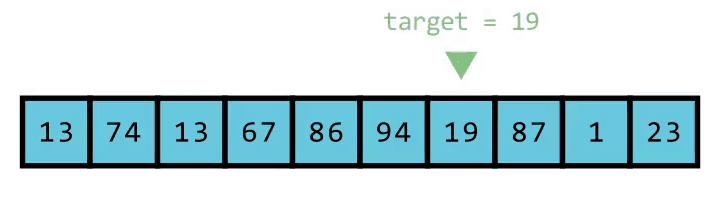

In [ ]:
def linear_search(data, target):  # data – список, target – искомое значение
    for index, elem in enumerate(data):
        if elem == target:
            return index
    return -1

- **Временная сложность**: $O(n)$, где $n$ - длина набора данных.
- **Пространственная сложность**: $O(1)$.

### Преимущества линейного поиска

- **Простота.** Алгоритм линейного поиска легко понять и реализовать.
- **Универсальность.** Линейный поиск можно использовать независимо от того, отсортирован набор данных или нет.
- **Производительность.** На небольших наборах данных ($n<=10^7$) линейный поиск работает достаточно быстро

### Недостатки линейного поиска


- **Производительность.** На больших наборах данных ($n>10^7$ )линейный поиск работает довольно медленно.
- **Игнорирование порядка.** Линейный поиск не использует информацию об упорядоченности элементов набора данных и не становится быстрее, если, например, набор отсортирован по возрастанию.

## Binary search. Бинарный поиск.

**Бинарный поиск** – это алгоритм поиска заданного значения в **отсортированном** наборе данных. Суть алгоритма бинарного поиска заключается в том, что набор данных делится пополам. Та половина, в которой точно может находиться искомое значение, остается, а другая отбрасывается. Затем повторяется та же процедура: оставшаяся часть набора снова делится пополам, находится половина, где может быть искомое значение – она остается, а другая отбрасывается. Процесс повторяется до тех пор, пока не будет найдено искомое значение или пока не останется ни одного элемента для дальнейшего поиска.

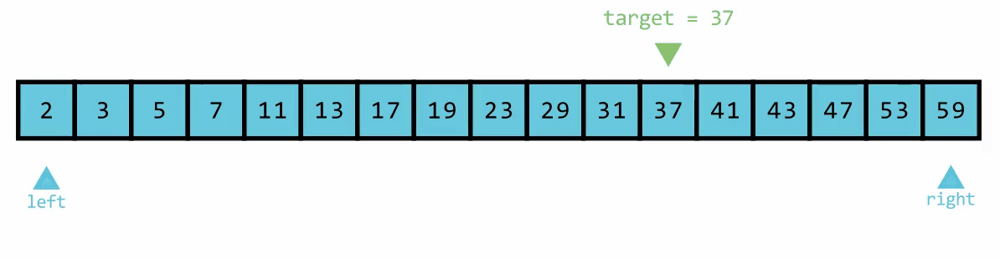

In [ ]:
def binary_search(data, target):  # data – список значений, target – искомое значение
    left, right = 0, len(data) - 1  # определяем левую и правую границы области поиска

    while left <= right:
        middle = left + (right - left) // 2  # вычисляем индекс серединного элемента
        elem = data[middle]  # определяем значение серединного элемента

        if elem == target:  # если серединный элемент равен искомому значению,
            return middle  # возвращаем его индекс

        if elem < target:  # если серединный элемент меньше искомого значения,
            left = middle + 1  # то сужаем область поиска слева
        else:  # если серединный элемент больше искомого значения,
            right = middle - 1  # то сужаем область поиска справа

    return -1

- **Временная сложность:** $O(log n)$, где $n$ – длина набора данных.
- **Пространственная сложность:** $O(1)$.

### Преимущества бинарного поиска

- **Простота.** Алгоритм бинарного поиска легко понять и реализовать.
- **Производительность.** Бинарный поиск работает очень быстро даже на огромных наборах данных.

### Недостатки бинарного поиска

- **Неуниверсальность.** Бинарный поиск применим только в том случае, если набор данных отсортирован.
- **Ограниченное применение.** Бинарный поиск неприменим к коллекциям, не поддерживающим индексацию и порядок.


Бинарный поиск работает очень быстро по сравнению с другими алгоритмами поиска.  
Например, в таблице ниже представлено сравнение производительности бинарного и линейного поиска при поиске случайного числа в отсортированном по неубыванию списке из $n$ чисел:

|**Размер входных данных**|**Бинарный поиск**|**Линейный поиск**|
|-------------------------|------------------|------------------|
|$n = 10^2$               |< 1 сек           |< 1 сек           |
|$n = 10^3$               |< 1 сек           |< 1 сек           |
|$n = 10^4$               |< 1 сек           |< 1 сек           |
|$n = 10^5$               |< 1 сек           |< 1 сек           |
|$n = 10^6$               |< 1 сек           |< 1 сек           |
|$n = 10^7$               |< 1 сек           |< 1 сек           |
|$n = 10^8$               |< 1 сек           |3 сек             |
|$n = 10^9$               |< 1 сек           |32 сек            |
|$n = 10^{10}$              |< 1 сек           |5 мин             |


### Экспоненциальный бинарный поиск

Одним из ключевых этапов при выполнении бинарного поиска является выбор начальных значений для левой и правой границ области поиска. Конечно, если поиск выполняется в **ограниченном** наборе данных, то этот этап является довольно простым: для левой границы необходимо выбрать индекс первого элемента набора, а для правой – индекс последнего.

Однако бывают ситуации, когда бинарный поиск необходимо выполнить в наборе данных, который **не ограничен** справа, то есть в таком наборе, у которого **есть первый элемент, но нет последнего**. В таких случаях выбор начального значения для правой границы становится не таким очевидным.  

Ниже приведена реализация алгоритма, выполняющего экспоненциальный бинарный поиск в наборе данных, который **не ограничен справа и отсортирован по возрастанию**.

In [ ]:
def exponential_binary_search(data, target):  # data – набор данных, target – искомое значение
    right = 1

    while data[right] < target:
        right *= 2

    left = right // 2  # вычисляем левую границу на основе правой границы

    while left <= right:
        middle = (left + right) // 2
        elem = data[middle]
        if elem == target:
            return True
        if elem < target:
            left = middle + 1
        else:
            right = middle - 1

    return -1

### Вещественный бинарный поиск

Бинарный поиск применим не только для поиска элементов в отсортированных наборах данных, но и для решения различных математических задач. Например, с его помощью можно находить корни уравнений, а также вычислять значения **возрастающих** или **убывающих** функций в заданных точках.

Пусть дана возрастающая функция $f(x) = x^5 + 5*x^3 + 3*x - 4$. 
Требуется найти такое значение аргумента $x$, при котором функция $f(x) = 0$.  
Гарантируется, что искомое значение существует и является единственным

In [ ]:
def f(x):
    return x**5 + 5 * x**3 + 3 * x - 4


left, right = 0, 1
epsilon = 0.000000001

while right - left > epsilon:
    middle = (left + right) / 2

    if f(middle) < 0:
        left = middle
    else:
        right = middle

print(left)  #  0.701463152654469
print(right)  # 0.7014631535857916

Вещественный бинарный поиск с помощью цикла while имеет риск зациклиться. Например, это произойдет во время поиска значения с точностью больше, чем может предоставить тип float: до семнадцати и больше знаков после запятой. В определенный момент типу float попросту не хватит точности, чтобы выразить очередное число из середины отрезка, поэтому оно останется равным левой или правой границе отрезка. В результате границы перестанут изменяться и алгоритм зациклится.

Чтобы избежать подобных проблем, можно использовать цикл for и выполнять фиксированное количество итераций. Так как на каждой итерации цикла отрезок, на котором выполняется поиск, уменьшается в 2 раза, то, например, за 100 итераций цикла отрезок уменьшится в $2^{100} = 10^{30}$ раз. Этого практически всегда будет достаточно для получения ответа с очень большой точностью.

In [ ]:
def f(x):
    return x**5 + 5 * x**3 + 3 * x - 4


left, right = 0, 50

for _ in range(100):
    middle = (left + right) / 2

    if f(middle) < 0:
        left = middle
    else:
        right = middle

print(left)
print(right)

0.7014631528853118
0.7014631528853119


## Поиск прыжками.

Быстрый поиск в **отсортированном** наборе данных можно выполнять не только с помощью бинарного поиска.  
Для этого существует еще один алгоритм – **поиск прыжками**.  
Принцип работы алгоритма поиска прыжками довольно прост. Сначала он делит набор данных на несколько равных частей, которые называются **блоками**.


Затем алгоритм ищет блок, в котором может находиться искомое значение, последовательно проверяя все блоки: первый, второй, третий и так далее. Правило проверки блока на наличие в нем искомого значения зависит от того, как отсортирован набор данных, в котором выполняется поиск. Если набор отсортирован **по неубыванию**, то правило проверки следующее:

- если искомое значение **меньше или равно** последнему элементу блока, то оно может находиться в этом блоке
- в противном случае искомое значение может находиться только в одном из следующих блоков  

После нахождения подходящего блока алгоритм ищет внутри него искомое значение с помощью обычного линейного поиска.

Скорость работы алгоритма поиска прыжками напрямую зависит от выбранного размера блока. Если размер блока будет слишком маленьким, то количество блоков будет большим и проверка каждого из них потребует много времени. С другой стороны, если размер блока будет слишком большим, то в каждом блоке будет много элементов, и итоговый поиск внутри блока будет медленным.

Для оптимальной скорости работы алгоритма размер блока принято брать равным $\lfloor \sqrt{n} \rfloor$, где $n$ – количество элементов в наборе данных. 

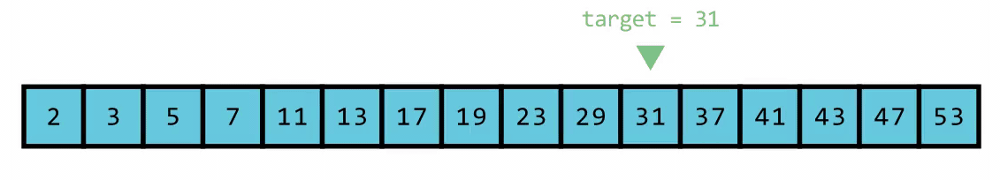

In [ ]:
from math import floor, sqrt


def jump_search(data, target):  # data – список значений, target – искомое значение
    n = len(data)

    if n == 0:  # если исходный список пуст,
        return -1  # то искомого значения в нем нет; возвращаем -1

    block_size = floor(sqrt(n))  # вычисляем размер блока
    left, right = 0, block_size - 1  # определяем левую и правую границы первого блока

    while data[right] < target:  # если последний элемент блока меньше искомого значения,
        left = right + 1  # то перемещаемся к следующему блоку, сдвигая левую
        right = min(
            right + block_size, n - 1
        )  # и правую границы и контролируя выход за пределы списка

        if left >= n:  # если мы достигли конца списка и не нашли искомое значение,
            return -1  # то искомого значения в нем нет; возвращаем -1

    for i in range(left, right + 1):  # внутри найденного блока ищем искомое значение,
        if data[i] == target:  # используя обычный линейный поиск
            return i

    return -1  # искомого значения в списке нет; возвращаем -1

- **Временная сложность**: $O(\sqrt{n})$, где $n$ - длина набора данных.
- **Пространственная сложность**: $O(1)$.

### Преимущества поиска прыжками

- **Высокая производительность** на больших наборах данных. Поиск прыжками выполняется очень быстро даже на наборах данных, состоящих из $10^{10}$ элементов.


### Недостатки поиска прыжками

- **Работает лишь в определенных условиях**. Поиск прыжками можно использовать только в том случае, если набор данных отсортирован, а также поддерживает индексацию и порядок.
- **Наличие более выгодных альтернатив**. Бинарный поиск имеет более выгодную временную сложность, чем поиск прыжками. Более того, реализовать бинарный поиск гораздо проще, чем поиск прыжками.